# Step1 : Understanding Problem statement & Dataset

## Problem Statement

1. Diabetes Classification

> Predict the given person is suffering from diabetes.

## DataSet

Further Information:

- Pima Indians Diabetes Database

- Number of Instances: 768

- Number of Attributes: 8(Features) plus class


### Columns Description:

1. Number of times pregnant

2. Plasma glucose concentration a 2 hours in an oral glucose tolerance test

3. Diastolic blood pressure (mm Hg)

4. Triceps skin fold thickness (mm)

5. 2-Hour serum insulin (mu U/ml)

6. Body mass index (weight in kg/(height in m)^2)

7. Diabetes pedigree function

8. Age (years)

Target/Label:
1. Class variable (0 or 1)

> Class Distribution: (class value 1 is interpreted as "tested positive for diabetes")

>> 0 --- 500

>> 1 ---- 268

** NOTE: Tabular Data - ML Model, Classifcation Model

## Step 2: Download the dataset and upload / Setup Model Development Environment 

1. For google Colab

A. Download Dataset and Upload to Google Drive

2. For Kaggle Notebook

A. Create Dataset at Kaggle Dataset and Add dataset to note book or find the dataset availablity and add to kaggle note nook 

## Prework is done - Now Steps to develop Model and deployment

#Step1: Import all key libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Step 2: Read the Dataset

1. Mount google Drive

2. Check data available at specified Path

3. Read File using pandas Library

In [2]:
from google.colab import drive

drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
!ls /content/gdrive/MyDrive/diabetes-classification

sample_submission.csv  test.csv  train.csv


In [4]:
train=pd.read_csv('/content/gdrive/MyDrive/diabetes-classification/train.csv')
train.head()

,p_id,no_times_pregnant,glucose_concentration,blood_pressure,skin_fold_thickness,serum_insulin,bmi,diabetes pedigree,age,diabetes
0,316,2,112,68,22,94,34.1,0.315,26,0
1,25,11,143,94,33,146,36.6,0.254,51,1
2,710,2,93,64,32,160,38.0,0.674,23,1
3,658,1,120,80,48,200,38.9,1.162,41,0
4,542,3,128,72,25,190,32.4,0.549,27,1


In [5]:
test=pd.read_csv('/content/gdrive/MyDrive/diabetes-classification/test.csv')
test.head()

,p_id,no_times_pregnant,glucose_concentration,blood_pressure,skin_fold_thickness,serum_insulin,bmi,diabetes pedigree,age
0,437,12,140,85,33,0,37.4,0.244,41
1,411,6,102,90,39,0,35.7,0.674,28
2,639,7,97,76,32,91,40.9,0.871,32
3,213,7,179,95,31,0,34.2,0.164,60
4,181,6,87,80,0,0,23.2,0.084,32


In [6]:
train.shape, test.shape

((614, 10), (154, 9))

# Step3: Data Preparation / Data Analytics / Explorative Data Analytics

This Needs

1. Statistical Conceptions to Analyse Data 
2. Data Cleaning / Data Munging
3. Data Visulization - Ploting
4. EDA - Domain knoweldge - case studies ( atleast 10+ )

## Few Key Data Preparation Essential

1. Missing value Checking and addressing them

2. Converting Categorical to Numerical - if dataset have any categorical value

3. Data transformation - if data is skewed

4. Outlier Detection and addressing them

5. Important Feature Selection

### Finding the NULL Value

In [7]:
train.isna().sum()

p_id                     0
no_times_pregnant        0
glucose_concentration    0
blood_pressure           0
skin_fold_thickness      0
serum_insulin            0
bmi                      0
diabetes pedigree        0
age                      0
diabetes                 0
dtype: int64

## Checking for Categorical value - one of way

In [8]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614 entries, 0 to 613
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   p_id                   614 non-null    int64  
 1   no_times_pregnant      614 non-null    int64  
 2   glucose_concentration  614 non-null    int64  
 3   blood_pressure         614 non-null    int64  
 4   skin_fold_thickness    614 non-null    int64  
 5   serum_insulin          614 non-null    int64  
 6   bmi                    614 non-null    float64
 7   diabetes pedigree      614 non-null    float64
 8   age                    614 non-null    int64  
 9   diabetes               614 non-null    int64  
dtypes: float64(2), int64(8)
memory usage: 48.1 KB


In [9]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 154 entries, 0 to 153
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   p_id                   154 non-null    int64  
 1   no_times_pregnant      154 non-null    int64  
 2   glucose_concentration  154 non-null    int64  
 3   blood_pressure         154 non-null    int64  
 4   skin_fold_thickness    154 non-null    int64  
 5   serum_insulin          154 non-null    int64  
 6   bmi                    154 non-null    float64
 7   diabetes pedigree      154 non-null    float64
 8   age                    154 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 11.0 KB


## Basic Statistic Analysis

In [10]:
train.describe()

,p_id,no_times_pregnant,glucose_concentration,blood_pressure,skin_fold_thickness,serum_insulin,bmi,diabetes pedigree,age,diabetes
count,614.000000,614.000000,614.000000,614.000000,614.000000,614.000000,614.000000,614.000000,614.000000,614.000000
mean,385.773616,3.853420,120.542345,68.765472,20.244300,79.355049,31.909935,0.466342,33.325733,0.348534
std,223.603024,3.358126,31.252286,19.914836,15.886083,117.709950,8.007699,0.331090,11.929569,0.476895
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,191.250000,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.240250,24.000000,0.000000
50%,387.000000,3.000000,117.000000,72.000000,23.000000,17.000000,32.000000,0.361000,29.000000,0.000000
75%,572.750000,6.000000,139.000000,80.000000,32.000000,126.000000,36.600000,0.613500,41.000000,1.000000
max,768.000000,17.000000,197.000000,114.000000,63.000000,846.000000,59.400000,2.420000,81.000000,1.000000


## Using Pandas Profile - Better understanding Data

In [11]:
!pip install ydata-profiling

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 352.3/352.3 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 16.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 37.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 39.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.4/455.4 kB 55.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 92.9 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=e43621dac45eb1fe2c45c4bc8739875c46fa7727525ac07d6ecffe5fd7c9edf8
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: wordcloud
    Found existing installation: wordcloud 1.8.2.2
    

In [12]:
from ydata_profiling import ProfileReport
profile = ProfileReport(train, title="Profiling Report")

In [13]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

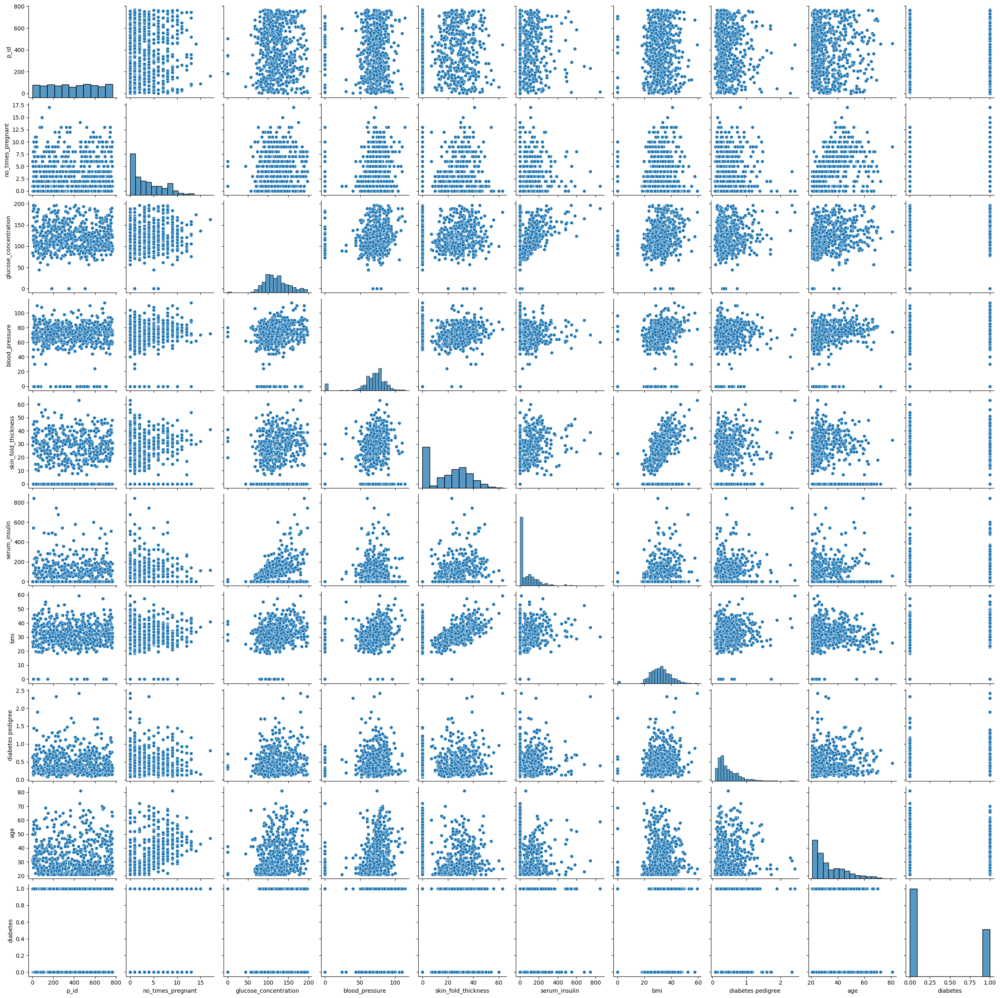

In [14]:
sns.pairplot(train)

## Class balancing Check?

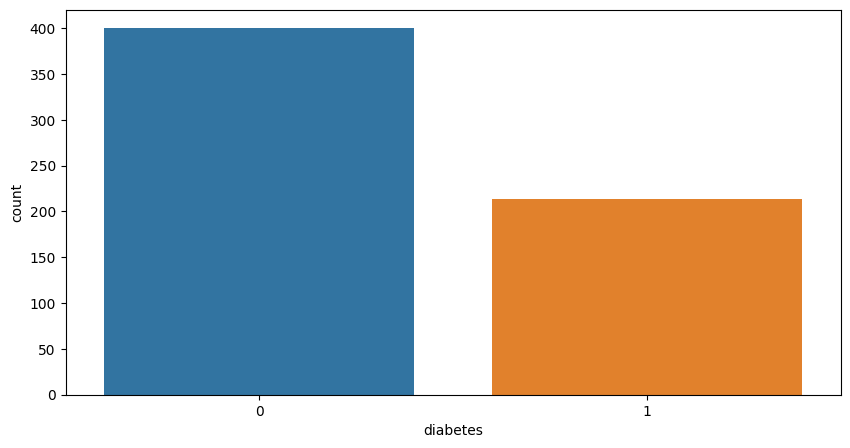

In [15]:
plt.figure(figsize=(10,5))
sns.countplot(x='diabetes', data=train)
plt.show()

## Check data is skewed or not

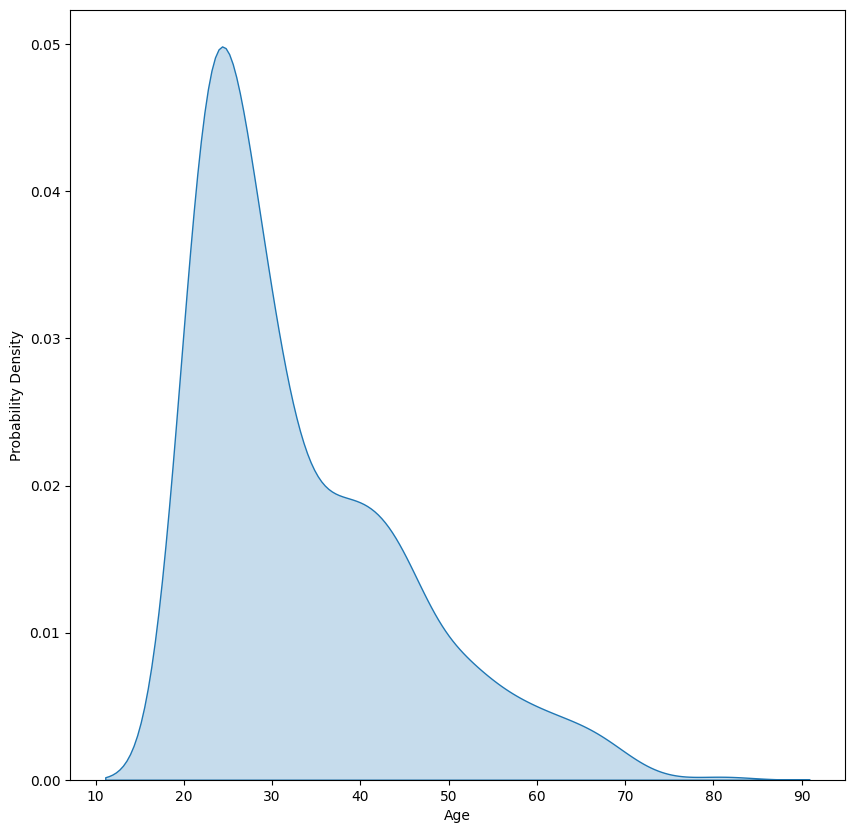

In [18]:
# Density plot of Age
plt.figure(figsize=(10,10))
sns.kdeplot(train['age'], fill=True, label="Age")
plt.xlabel('Age')
plt.ylabel('Probability Density')
plt.show()

## Outlier Check using Box Plot

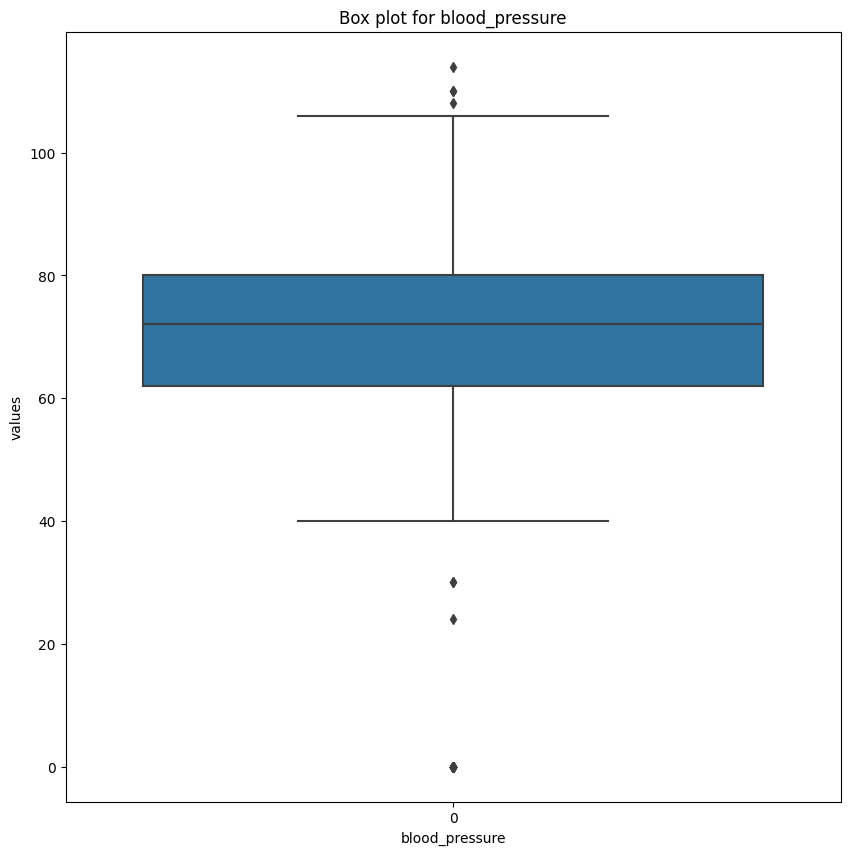

In [23]:
plt.figure(figsize=(10,10))
sns.boxplot(train['blood_pressure'])
plt.title("Box plot for blood_pressure")
plt.xlabel('blood_pressure')
plt.ylabel('values')
plt.show()


## Understanding 

1. important features 
2. Duplicate Features

- Correlation matrix & heatmap

In [24]:
#Correlation Matrix

# Generate and visualize the correlation matrix
corr = train.corr().round(2)
corr

,p_id,no_times_pregnant,glucose_concentration,blood_pressure,skin_fold_thickness,serum_insulin,bmi,diabetes pedigree,age,diabetes
p_id,1.00,-0.03,-0.00,0.03,0.01,0.01,-0.00,-0.05,0.02,-0.07
no_times_pregnant,-0.03,1.00,0.12,0.14,-0.09,-0.09,-0.00,-0.01,0.53,0.21
glucose_concentration,-0.00,0.12,1.00,0.16,0.04,0.33,0.22,0.13,0.24,0.47
blood_pressure,0.03,0.14,0.16,1.00,0.21,0.09,0.30,0.04,0.24,0.07
skin_fold_thickness,0.01,-0.09,0.04,0.21,1.00,0.44,0.41,0.19,-0.14,0.05
serum_insulin,0.01,-0.09,0.33,0.09,0.44,1.00,0.20,0.18,-0.05,0.12
bmi,-0.00,-0.00,0.22,0.30,0.41,0.20,1.00,0.12,0.03,0.28
diabetes pedigree,-0.05,-0.01,0.13,0.04,0.19,0.18,0.12,1.00,0.05,0.17
age,0.02,0.53,0.24,0.24,-0.14,-0.05,0.03,0.05,1.00,0.22
diabetes,-0.07,0.21,0.47,0.07,0.05,0.12,0.28,0.17,0.22,1.00


<ipython-input-25-4d435f7c86ed>:2: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(corr, dtype=np.bool)


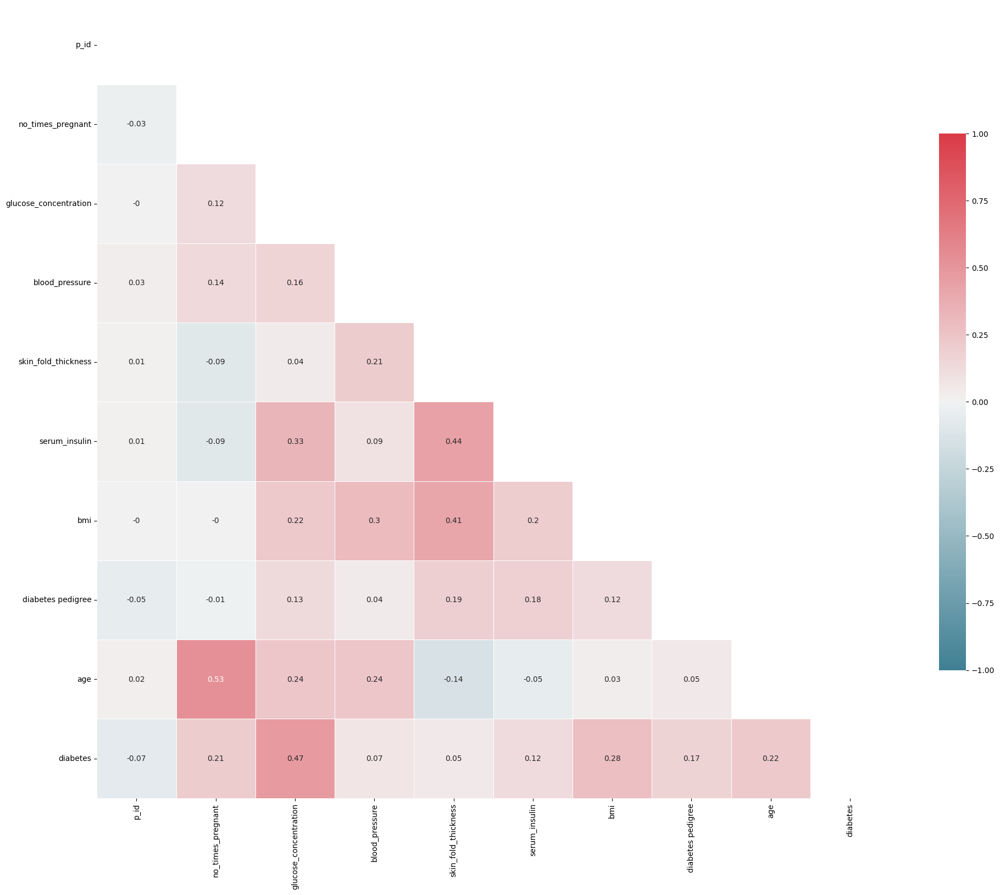

In [25]:
# Mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set figure size
f, ax = plt.subplots(figsize=(20, 20))

# Define custom colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap
sns.heatmap(corr, mask=mask, cmap=cmap, vmin=-1, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

plt.tight_layout()

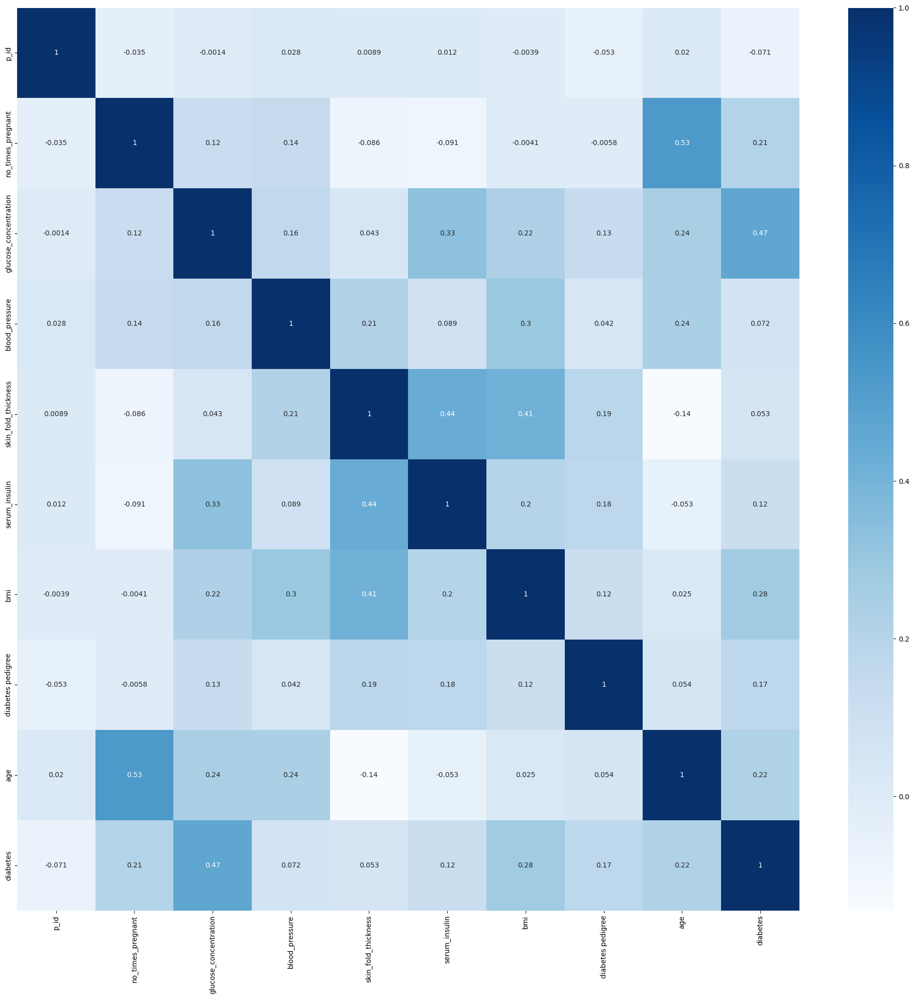

In [26]:
plt.figure(figsize=(20,20))
sns.heatmap(train.corr(), cmap='Blues', annot=True)
plt.tight_layout()

# Step 4: Model Training - after making Data ready for training

## Now Split data from training to check model performs well, before checking on testing Data

In [27]:
X=train.drop(['diabetes'], axis=1)
y=train['diabetes']

In [28]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test=train_test_split(X, y, test_size=0.3, random_state=7)


## Any Model  - Classification selection and training

In [29]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix


In [30]:
lr=LogisticRegression()
lr.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

# Step 5: Model Evaluation

In [31]:
from sklearn import metrics

# Model Evaluation
y_pred=lr.predict(X_train)

print("Accuracy Score:-", metrics.accuracy_score(y_train, y_pred))
print("F1 Score:-", metrics.f1_score(y_train, y_pred))
print("Average Precision Score:-", metrics.average_precision_score(y_train, y_pred))
print("Log Loss:-", metrics.log_loss(y_train, y_pred))
print("Precision Score:-", metrics.precision_score(y_train, y_pred))
print("Recall Score:-", metrics.recall_score(y_train, y_pred))
print("ROC-AUC Score:-", metrics.roc_auc_score(y_train, y_pred))


Accuracy Score:- 0.7808857808857809
F1 Score:- 0.6384615384615385
Average Precision Score:- 0.5607560548079654
Log Loss:- 7.897676966379982
Precision Score:- 0.7280701754385965
Recall Score:- 0.5684931506849316
ROC-AUC Score:- 0.7294762573212644


## Step 6: Display the Model Resul

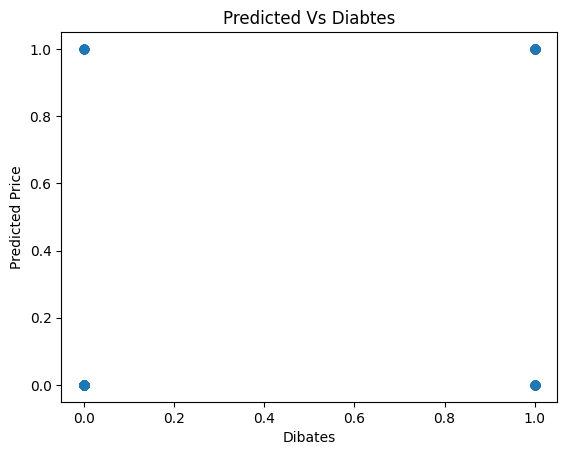

In [32]:
# visualize the difference between the actual and predicted price 
plt.scatter(y_train, y_pred)
plt.xlabel("Dibates")
plt.ylabel("Predicted Price")
plt.title("Predicted Vs Diabtes")
plt.show()

<ipython-input-33-9dbdf9e5aa82>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_train-y_pred)


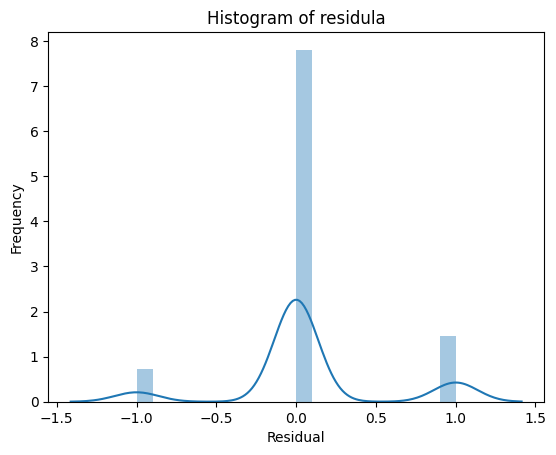

In [33]:
sns.distplot(y_train-y_pred)
plt.xlabel("Residual")
plt.ylabel("Frequency")
plt.title("Histogram of residula")
plt.show()

In [36]:
from sklearn.metrics import classification_report

# Model Evaluation
y_pred=lr.predict(X_test)

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.77      0.88      0.82       117
           1       0.73      0.56      0.63        68

    accuracy                           0.76       185
   macro avg       0.75      0.72      0.73       185
weighted avg       0.76      0.76      0.75       185



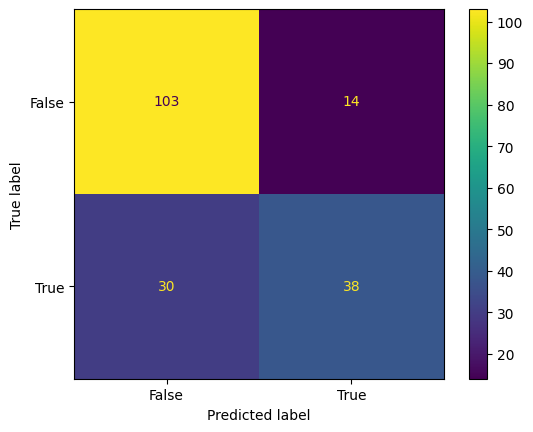

In [37]:
confusion_matrix = metrics.confusion_matrix(y_test, y_pred)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])

cm_display.plot()
plt.show()

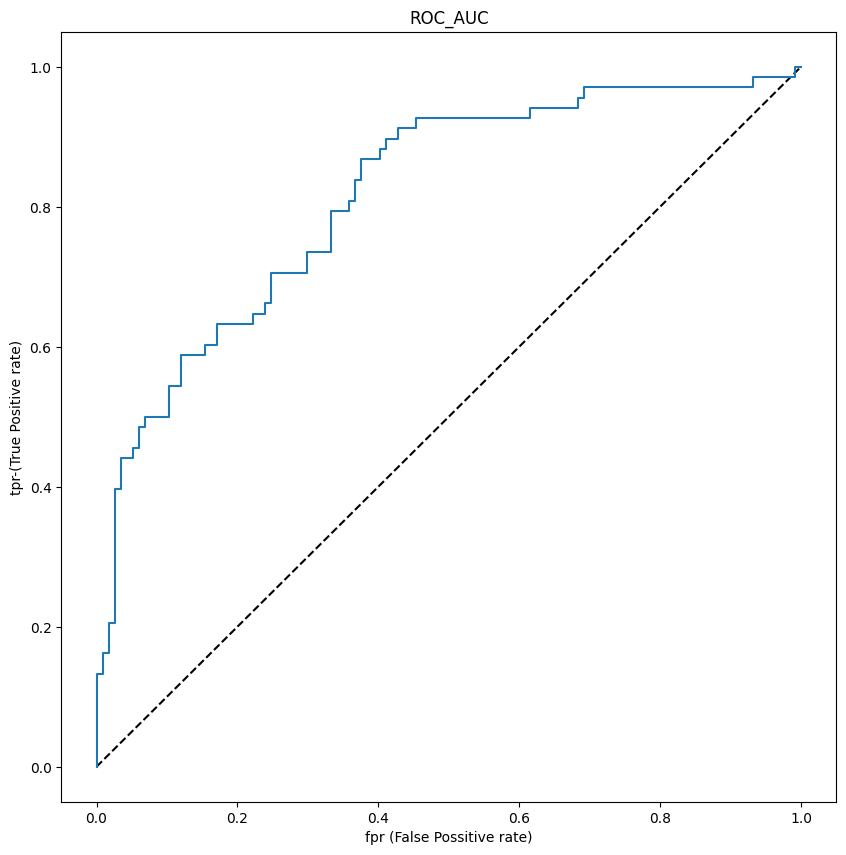

In [38]:
from sklearn.metrics import roc_curve

y_test_pred_prob=lr.predict_proba(X_test)[:,1]

fpr, tpr,thresholds=roc_curve(y_test,y_test_pred_prob)

plt.figure(figsize=(10,10))
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr, tpr, label='Logistic Regression')
plt.xlabel("fpr (False Possitive rate)")
plt.ylabel("tpr-(True Positive rate)")
plt.title("ROC_AUC")
plt.show()

### Another Algorithm

In [39]:
# XGBoost classification
from xgboost import XGBClassifier
xgb=XGBClassifier()
xgb.fit(X_train, y_train)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [41]:
y_pred=xgb.predict(X_train)
print("Accuracy Score:-", metrics.accuracy_score(y_train, y_pred))
print("F1 Score:-", metrics.f1_score(y_train, y_pred))
print("Average Precision Score:-", metrics.average_precision_score(y_train, y_pred))
print("Log Loss:-", metrics.log_loss(y_train, y_pred))
print("Precision Score:-", metrics.precision_score(y_train, y_pred))
print("Recall Score:-", metrics.recall_score(y_train, y_pred))
print("ROC-AUC Score:-", metrics.roc_auc_score(y_train, y_pred))

Accuracy Score:- 1.0
F1 Score:- 1.0
Average Precision Score:- 1.0
Log Loss:- 2.2204460492503136e-16
Precision Score:- 1.0
Recall Score:- 1.0
ROC-AUC Score:- 1.0


In [42]:
### Feature Importance
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt
model = RandomForestClassifier()
model.fit(X,y)

RandomForestClassifier()

In [43]:
print(model.feature_importances_)

[0.09418474 0.06556198 0.26978609 0.07297779 0.05620869 0.05887838
 0.14432807 0.11057705 0.12749722]


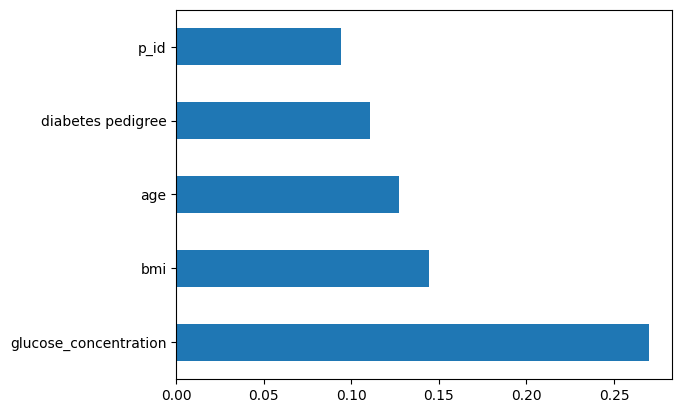

In [44]:
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(5).plot(kind='barh')
plt.show()

## Model Saving

In [45]:
!pip install joblib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [46]:
import joblib
# save the model to a file
joblib.dump(xgb, 'xgb_model.joblib')

['xgb_model.joblib']

In [47]:
from google.colab import files
files.download('xgb_model.joblib') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Create A Folder
- DiabeticsPred
- CSV Files
- Model Weights
- Code File

# Now Write Streamlite App Function

# Create GitHub Repository 

# Now Create StreamliteAPP with ease